# ANÁLISIS EXPLORATORIO Y PREPROCESAMIENTO

# Carga de las bibliotecas y los datos

In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
import joblib

In [2]:
# Carga del conjunto de entrenamiento
data = pd.read_csv("../Data/train.csv", sep=",", index_col="Id")
pd.options.display.max_columns = None
data

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,NaN,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500


In [3]:
# Carga del conjunto de prueba
datatest = pd.read_csv("../Data/test.csv", sep=",", index_col="Id")

# Análisis descriptivo

Resumen estadístico por columna.

In [4]:
data.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [5]:
# Identificación de las veinte variables con mayor cantidad de datos faltantes, ordenadas en forma descendente
data.isnull().sum(axis=0).sort_values(ascending=False).head(20)

PoolQC          1453
MiscFeature     1406
Alley           1369
Fence           1179
MasVnrType       872
FireplaceQu      690
LotFrontage      259
GarageYrBlt       81
GarageCond        81
GarageType        81
GarageFinish      81
GarageQual        81
BsmtExposure      38
BsmtFinType2      38
BsmtCond          37
BsmtQual          37
BsmtFinType1      37
MasVnrArea         8
Electrical         1
MSSubClass         0
dtype: int64

Dado que el conjunto incluye 1460 registros, varias variables presentan una alta proporción de datos faltantes, como: PoolQC (99.5%), MiscFeature (96.3%), o Alley (93.8%). Más adelante se detalla el tratamiento de estas variables.



In [6]:
# Obtiene los veinte registros con mayor cantidad de datos faltantes en orden descendente.
data.isnull().sum(axis=1).sort_values(ascending=False).head(20)

Id
1219    16
534     16
40      16
1012    16
1180    15
521     15
706     15
1031    12
1322    12
288     12
1036    12
376     12
1144    12
1327    11
157     11
943     11
536     11
166     11
1324    11
156     11
dtype: int64

No se encontraron registros que justificaran su eliminación por una alta proporción de datos faltantes.

# Análisis gráfico

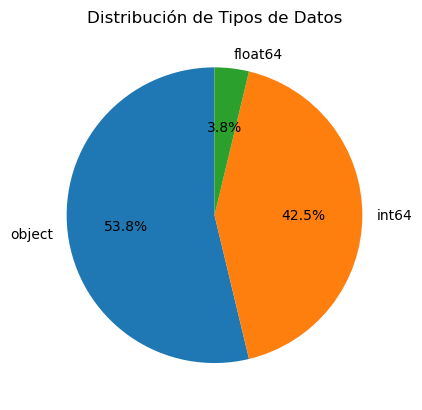

In [7]:
# Gráfica de pie de los tipos de datos
dtype_counts = data.dtypes.value_counts()
dtype_counts
plt.pie(x=dtype_counts, labels=dtype_counts.index.astype(str), autopct='%1.1f%%', startangle=90)
plt.title('Distribución de Tipos de Datos')
plt.show()


De acuerdo al gráfico de distribución de los tipos de datos, podemos observar que más del 50% de las variables son categóricas. La predominancia de este tipo de variables sugiere que el preprocesamiento será un paso crítico. Además, la descripción de los datos aclara que, para algunas de estas variables, un valor "NA" indica la ausencia de la característica y no un dato faltante. Para facilitar la visualización gráfica, estos casos de "NA" se sustituyeron por la etiqueta "NE" (No Existe). 

In [8]:
# Separación de los datos en categóricos y numéricos
def split_data(df):
    datos_numericos = df.select_dtypes(include=["int64", "float64"])
    datos_categoricos = df.select_dtypes(include=["object"])
    datos_categoricos = datos_categoricos.fillna("NE")
    return datos_numericos, datos_categoricos
datos_numericos, datos_categoricos = split_data(data)

## Visualización de las variables categóricas

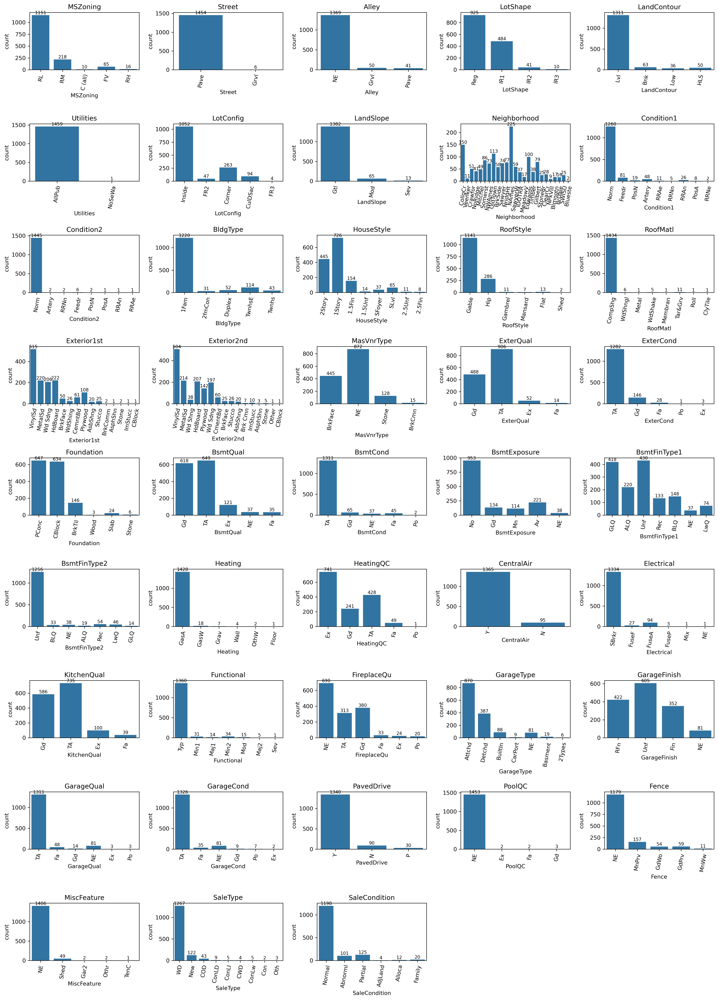

In [9]:

def countpl(df):
    columns = df.columns
    plt.figure(figsize=(18, 25), dpi=300)
    i = 0
    for col in columns:
        i += 1
        ax = plt.subplot(9, 5, i)  
        sns.countplot(data=df, x=col, ax=ax)
        plt.xticks(rotation=80)
        plt.title(col)
        for container in ax.containers:
            ax.bar_label(container, fmt='%d', label_type='edge', fontsize=8)
    plt.tight_layout()
    plt.show()
countpl(datos_categoricos)


**Variables poco informativas**  
Las variables Street, Utilities y RoofMatl presentan baja variabilidad, lo que las hace poco informativas. Estás variables fueron eliminadas durante el preprocesamiento.

**Variables categóricas con valores "NA"**   
Se identificaron catorce variables con una codificación para las que "NA" indica la ausencia de la característica y no un dato faltante. Por ejemplo, PoolQC es una variable categórica con cinco estados posibles: cuatro representan diferentes niveles de calidad de la alberca, y el quinto ("NA") indica que la propiedad no tiene alberca. La mayoría de este tipo de variables está vinculada a la calidad de albercas, chimeneas, sótanos y garages. Estas variables plantean dos problemas principales: 

Contradicción lógica: Mezclan una codificación ordinal (calidad) con una binaria (presencia/ausencia).

Redundancia de información: La ausencia ya está representada en otras variables numéricas. Por ejemplo, el estado "NA" en PoolQC corresponde a un área de alberca igual a 0 en PoolArea. 

Debido a estas inconsistencias, estas variables también se eliminaron en el preprocesamiento.

## Visualización de las variables numéricas

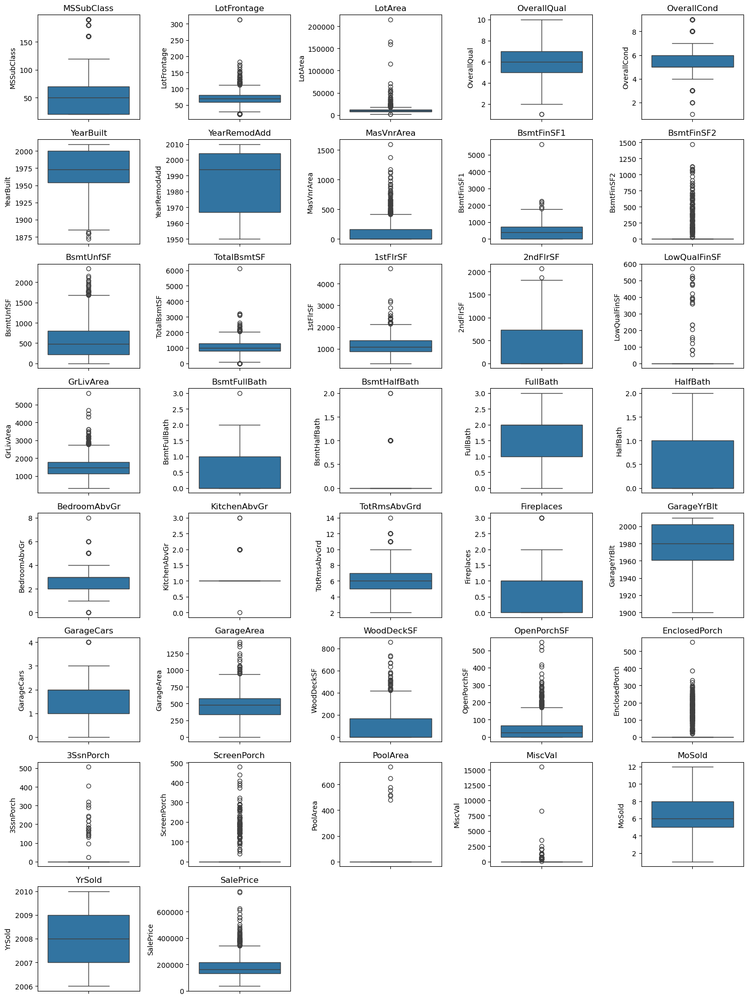

In [10]:
def boxp(columns, x):
    plt.figure(figsize=(15, 20))
    i = 0
    for col in columns:
        i += 1
        plt.subplot(8, 5, i)  
        sns.boxplot(data=x, y=col)
        plt.title(col)
    plt.tight_layout()
    plt.show()
boxp((datos_numericos.columns), data)

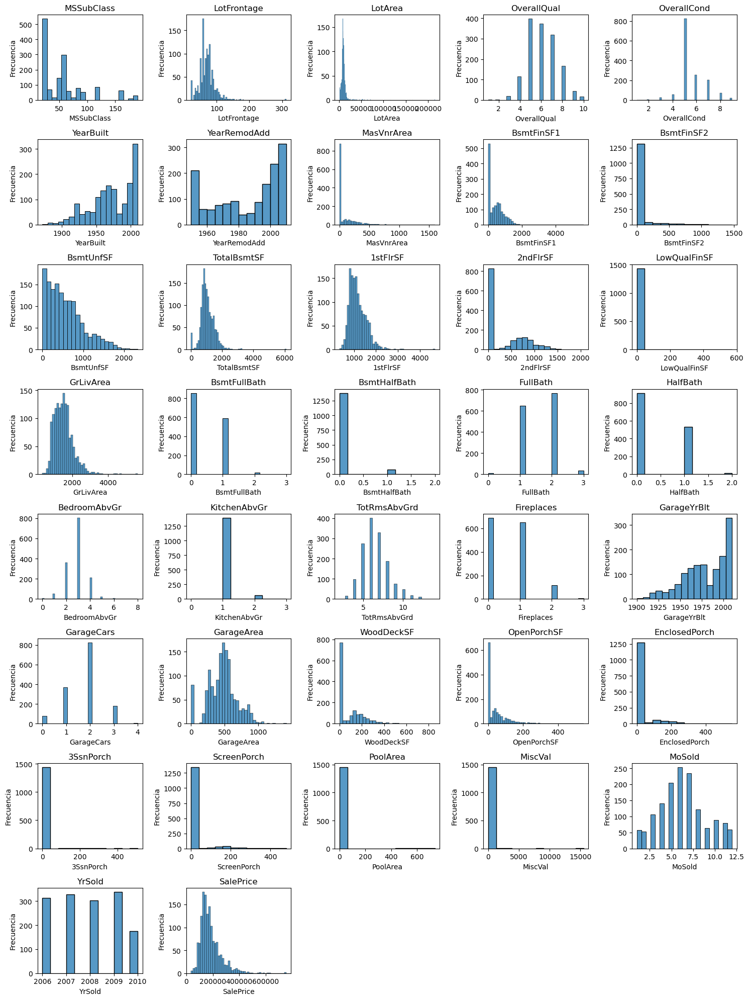

In [11]:
def hist(columns, x):
    plt.figure(figsize=(15, 20))
    i = 0
    for col in columns:
        i += 1
        plt.subplot(8, 5, i)  
        sns.histplot(data=x, x=col)
        plt.title(col)
        plt.ylabel('Frecuencia')
    plt.tight_layout()
    plt.show()
hist(datos_numericos.columns, data)

La mayoría de las variables presentan valores atípicos significativos que podrían impactar los análisis y modelos predictivos. Muchas variables, como LotArea y GrLivArea, presentan distribuciones sesgadas hacia la derecha. Otras variables, como OverallQual y OverallCond, tienen valores discretos que pueden interpretarse como ordinales. 

En particular, la variable MSSubClass, aunque codificada como numérica, representa tipos de viviendas (e.g., casas de una planta, dúplex) y carece de un orden intrínseco. Por este motivo, fue tratada como categórica y procesada mediante codificación por frecuencia.

# Preprocesamiento de los datos

## Codificación y tratamiento de las variables categoricas

Un total de 17 variables fueron eliminadas:

Catorce variables con contradicción lógica o redundancia: BsmtQual, BsmtCond, BsmtExposure, BsmtFinType1, BsmtFinType2, FireplaceQu, GarageFinish, GarageQual, GarageCond, PoolQC, Alley, Fence, MiscFeature y MasVnrType.

Tres variables (Street, Utilities y RoofMatl) por ser poco informativas.


In [12]:
def drop_cat(df, df_original):
    df = df.drop(columns=['Street', 'Utilities', 'RoofMatl', 'BsmtQual','BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'FireplaceQu', 'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC', 'Alley', 'Fence', 'MiscFeature', 'MasVnrType'])
    
    # Incorporación de MSSubClass al dataframe de datos categoricos
    df["MSSubClass"] = df_original["MSSubClass"].astype(str)
    return df
datos_categoricos = drop_cat(datos_categoricos, data)

Se aplicaron tres tipos de codificación a las variables categóricas, dependiendo de sus características:

1- Codificación binaria: Se utilizó para las variables Heating y CentralAir, transformándolas en valores binarios (0 o 1).

2- Codificación ordinal: Aplicada a variables con un orden natural en sus categorías, como niveles crecientes o decrecientes de calidad. Este grupo incluye las variables LotShape, LandSlope, ExterQual, ExterCond, HeatingQC, KitchenQual, Functional y PavedDrive.

3- Codificación por frecuencia: Implementada para las variables restantes. Las categorías fueron reemplazadas por la frecuencia con la que aparecen en los datos. Además, para evitar sesgos en los algoritmos, las categorías con baja frecuencia (menos de 15 o 30 ocurrencias, según el caso) se agruparon bajo una categoría genérica denominada "Others".

La variable MSSubClass fue incorporada al grupo de datos categóricos para ser codificada por frecuencia.

In [13]:
# Mapeos binarios
binary_mappings = {
    'Heating': {'GasA': 1, 'GasW': 0, 'Grav': 0, 'Wall': 0, 'OthW': 0, 'Floor': 0},
    'CentralAir': {'Y': 1, 'N': 0}}

# Mapeos ordinales
ordinal_mappings = {
    'LotShape': {'Reg': 4, 'IR1': 3, 'IR2': 2, 'IR3': 1},
    'LandSlope': {'Gtl': 3, 'Mod': 2, 'Sev': 1},
    'ExterQual': {'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2},
    'ExterCond': {'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1},
    'HeatingQC': {'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1},
    'KitchenQual': {'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2},
    'Functional': {'Typ': 8, 'Min1': 7, 'Min2': 6, 'Mod': 5, 'Maj1': 4, 'Maj2': 3, 'Sev': 2, 'Sal': 1},
    'PavedDrive': {'Y': 3, 'P': 2, 'N': 1}}

# Codificación binaria y ordinal.
def apply_mappings(data, mappings):
    
    for column, mapping in mappings.items():
        data[column] = data[column].map(mapping)
    return data

# Unión de ambos mapeos
all_mappings = {**binary_mappings, **ordinal_mappings}
datos_categoricos = apply_mappings(datos_categoricos, all_mappings)

# Codificación por frecuencia
frequency_columns_30 = ['MSZoning', 'LandContour', 'LotConfig', 'Condition1', 
                        'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 
                        'Foundation', 'Electrical', 'GarageType', 'SaleType', 
                        'SaleCondition', "MSSubClass"]

frequency_columns_15 = ['Neighborhood', 'Exterior1st', 'Exterior2nd']

def frequency_encoding(df, columns, threshold):
    for column in columns:
        counts = df[column].value_counts()
        df[column] = df[column].apply(lambda x: x if counts[x] > threshold else 'Others')
        frequencies = df[column].value_counts(normalize=True)
        df[column] = df[column].map(frequencies)
    return df

datos_categoricos = frequency_encoding(datos_categoricos, frequency_columns_30, 30)
datos_categoricos = frequency_encoding(datos_categoricos, frequency_columns_15, 15)



## Tratamiento de las variables numéricas

Se generó una matriz de correlación utilizando el coeficiente de Spearman, considerando variables numéricas (continuas y discretas) y variables categóricas codificadas como ordinales. Esto permitió identificar pares de variables con alta correlación.

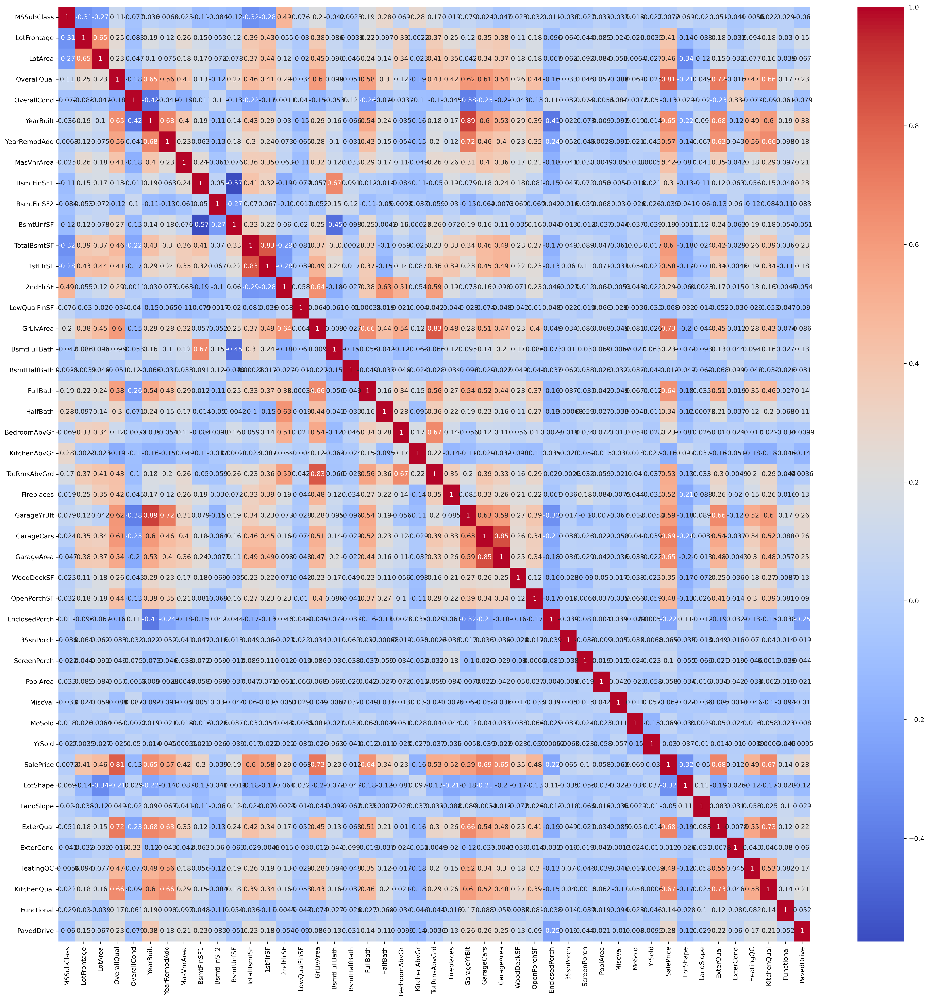

In [14]:

ordinal = list(ordinal_mappings.keys())
datos_numericos_c = datos_numericos.copy()
datos_numericos_c[ordinal] = datos_categoricos[ordinal]
correlation_matrix = datos_numericos_c.corr("spearman")
plt.figure(figsize=(26, 26), dpi=300)
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.show()

Se estableció un umbral de correlación de 0.8 para la eliminación de variables. En cada par altamente correlacionado, se eliminó la variable con menor correlación de Spearman respecto a la variable objetivo.

In [15]:
threshold = 0.80

correlation_matrix = correlation_matrix.drop("SalePrice").drop(columns="SalePrice")
high_corr_pairs = correlation_matrix.where(
    (correlation_matrix.abs() > threshold) & (correlation_matrix != 1)
).stack().reset_index()

high_corr_pairs.columns = ['Variable 1', 'Variable 2', 'Correlación']
high_corr_pairs = high_corr_pairs.drop_duplicates(subset="Correlación", ignore_index=True)
high_corr_pairs

,Variable 1,Variable 2,Correlación
0,YearBuilt,GarageYrBlt,0.890546
1,TotalBsmtSF,1stFlrSF,0.829292
2,GrLivArea,TotRmsAbvGrd,0.827874
3,GarageCars,GarageArea,0.853317


In [16]:
# Eliminación de variables correlacionadas. Adicionalmente, se eliminó la variable MSSubClass, previamente tratada como categórica.
def drop_num(df):
    df = df.drop(columns=["MSSubClass", "GarageYrBlt", "1stFlrSF", "TotRmsAbvGrd", "GarageArea"])
    return df
datos_numericos = drop_num(datos_numericos)

# Imputación de los datos faltantes

Los valores faltantes en las variables numéricas se imputaron utilizando la mediana. Posteriormente, los datos numéricos y categóricos se combinaron en un único DataFrame.

In [17]:
def imputer_concat(df_num, df_cat):
    # Imputación con la mediana
    imputer = SimpleImputer(strategy='median')
    data_imputed = pd.DataFrame(imputer.fit_transform(df_num), columns=df_num.columns, index=df_num.index)

    # Concatenación en un sólo DataFrame
    data_complete = pd.concat([data_imputed, df_cat], axis = 1)

    return data_complete
data_complete = imputer_concat(datos_numericos, datos_categoricos)

# Transformación y escalamiento

Se aplicó una transformación logarítmica a 15 variables con distribuciones sesgadas, incluyendo la variable objetivo. Posteriormente se normalizaron todas las variables, centrando sus medias en cero y escalándolas según su desviación estándar. Finalmente, el DataFrame resultante fue exportado como un archivo CSV para posteriormente aplicar los modelos de regresión.

In [18]:
# Lista de variables para transformar.
log_vars = ['LotFrontage', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', '1stFlrSF', '2ndFlrSF', 
            'GrLivArea', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', 
            '3SsnPorch', 'ScreenPorch', 'PoolArea', 'LotArea', 'MasVnrArea', 'TotalBsmtSF', 'SalePrice']

# Nombre del archivo final.
output_file = "../Data/processed_train.csv"


def log_and_scale(df, log_vars, output_filename):

    # Copia del DataFrame original
    transformed_data = df.copy()

    # Transformación logarítmica (log1p) para todas las variables especificadas
    for col in log_vars:
        if col in transformed_data.columns:
            transformed_data[col] = transformed_data[col].apply(lambda x: np.log1p(x))

    # Estandarización con StandardScaler.
    scaler = StandardScaler()
    scaled_data = pd.DataFrame(scaler.fit_transform(transformed_data), columns=transformed_data.columns, index=transformed_data.index)

    # Guardar el DataFrame transformado en un archivo CSV.
    scaled_data.to_csv(output_filename)
    return scaled_data, transformed_data

# Aplicar la función al DataFrame
transformed_scaled, transformed_data = log_and_scale(data_complete, log_vars, output_file)

In [19]:
# Guarda el objeto scaler_target para poder desescalar la variable objetivo después de las predicciones
scaler_target = StandardScaler()
transformed_data["SalePrice"] = scaler_target.fit_transform(transformed_data[["SalePrice"]])
joblib.dump(scaler_target, '../Data/scaler_targetb.pkl')

['../Data/scaler_targetb.pkl']

# Aplicación del preprocesamiento al conjunto de datos de prueba

In [20]:
# Separación de los datos en categóricos y numéricos.
datos_numericos_test, datos_categoricos_test = split_data(datatest)

# Eliminación de 17 variables categóricas e incorporación de MSSubClass al DataFrame categórico.
datos_categoricos_test = drop_cat(datos_categoricos_test, datatest)

# Codificación binaria y ordinal.
datos_categoricos_test = apply_mappings(datos_categoricos_test, all_mappings)

# Codificación por frecuencia.
datos_categoricos_test = frequency_encoding(datos_categoricos_test, frequency_columns_30, 30)
datos_categoricos_test = frequency_encoding(datos_categoricos_test, frequency_columns_15, 15)

# Eliminación de variables correlacionadas.
datos_numericos_test = drop_num(datos_numericos_test)
data_complete_test = imputer_concat(datos_numericos_test, datos_categoricos_test)

# Transformación, escalamiento y exportación del DataFrame.
del log_vars[-1]
output_file_test = "../Data/processed_test.csv"
transformed_scaled_test, transformed_data_test = log_and_scale(data_complete_test, log_vars, output_file_test)


# Consideraciones adicionales

El objetivo principal de obtener una matriz de correlación fue identificar pares de variables altamente correlacionadas entre sí. Sin embargo, esta herramienta también permite destacar variables con alta correlación con la variable objetivo. En este caso, variables como ExterQual, KitchenQual, GarageCars, GrLivArea y OverallQual presentan un coeficiente de correlación de Spearman superior a 0.65 con el precio de venta. Aunque es razonable esperar que estas variables aporten información significativa a los algoritmos de regresión, es importante considerar que la correlación no siempre se traduce directamente en la importancia dentro del modelo, ya que los algoritmos de machine learning también consideran relaciones no lineales e interacciones entre variables.